In [2]:
getwd()

[1] "/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/code/blood_trajectory"

In [1]:
here::i_am("blood_trajectory/manual_iterativeLSI.ipynb")

suppressPackageStartupMessages(library(scran))
suppressPackageStartupMessages(library(scater))
suppressPackageStartupMessages(library(batchelor))
suppressPackageStartupMessages(library(uwot))
suppressPackageStartupMessages(library(parallel))

# Load default settings
source(here::here("settings.R"))
source(here::here("utils.R"))

BPPARAM <- BiocParallel::bpparam()
BPPARAM$workers = 16

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/atlasses/gastrulation_multiome/code



In [30]:
args = list()
args$outdir = file.path(io$basedir, 'results/epiblast_blood') 
args$trajectory_name <- "epiblast_blood"

In [31]:
sample_metadata = fread(file.path(args$outdir,sprintf("%s_sample_metadata.txt.gz",args$trajectory_name)))

latent = fread(sprintf('%s/scVI_latent.csv', args$outdir))[-1,-1] %>%
    setnames(c(paste0('VI_', 1:25))) %>% 
    .[,cell:=sample_metadata$cell] %>%
    as.data.frame() %>% tibble::column_to_rownames('cell')

LSI = fread(sprintf("%s/atac/LSI_ArchR.txt.gz",args$outdir)) %>%
    as.data.frame() %>% tibble::column_to_rownames('cell')

In [33]:
# Check if cells are in the same order
summary(rownames(latent) == rownames(LSI))

   Mode    TRUE 
logical   12686 

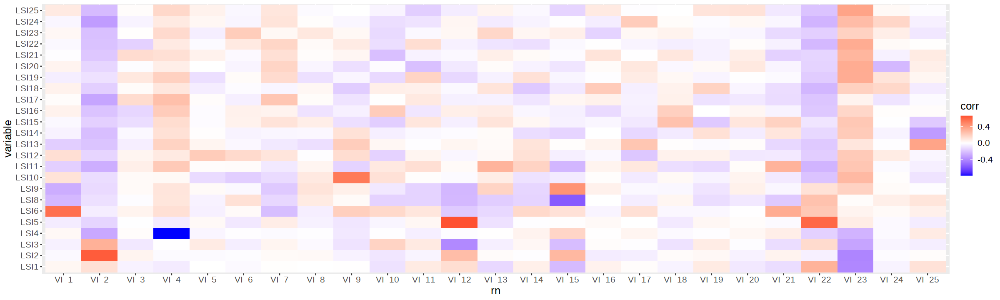

In [50]:
corr.dt = as.data.table(cor, keep.rownames=T) %>% 
    melt(id = "rn", value.name = "corr") %>% 
    .[,rn:=factor(rn, levels=paste0('VI_', 1:25))]
options(repr.plot.width=20, repr.plot.height=6)
ggplot(corr.dt, aes(rn, variable, fill=corr)) + 
    geom_tile() + 
    scale_fill_gradient2(low='blue', mid='white', high='red') + 
    theme(text=element_text(color='black', size=15))

LSI4      LSI5      LSI2      LSI8      LSI6     LSI10      LSI9      LSI1 
0.7916554 0.6636666 0.6311330 0.5666762 0.5654886 0.5305530 0.4378510 0.4086358 
     LSI3     LSI13     LSI25     LSI20     LSI14     LSI22     LSI19     LSI24 
0.4017332 0.3734043 0.3722948 0.3402203 0.3394884 0.3394641 0.3391199 0.3372439 
    LSI11     LSI17     LSI21     LSI15     LSI18     LSI12     LSI23     LSI16 
0.3116574 0.3063649 0.3011052 0.2508730 0.2489453 0.2195724 0.2133487 0.2102090

[1] 24

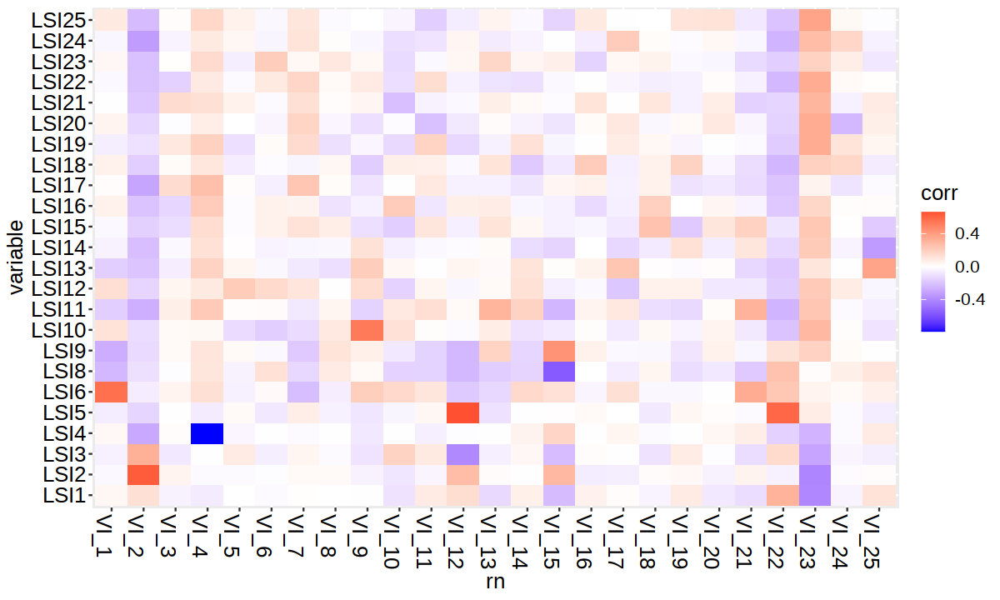

In [59]:
# Remove highly correlated LSIs
cor = cor(latent, LSI)
corr.dt = as.data.table(cor, keep.rownames=T) %>% 
    melt(id = "rn", value.name = "corr") %>% 
    .[,rn:=factor(rn, levels=paste0('VI_', 1:25))]
options(repr.plot.width=10, repr.plot.height=6)
ggplot(corr.dt, aes(rn, variable, fill=corr)) + 
    geom_tile() + 
    scale_fill_gradient2(low='blue', mid='white', high='red') + 
    theme(text=element_text(color='black', size=15), 
         axis.text.x = element_text(color='black', size=15, angle=-90, hjust=0, vjust=1),
         axis.text.y = element_text(color='black', size=15))

maxcor = apply(abs(cor), 2, max)
maxcor[order(-maxcor)]
keep = colnames(cor[,maxcor<0.9])
length(keep)

# No LSI have more than 0.9 correlation with latent spaces

In [63]:
joint_dimred = cbind(latent, LSI)
joint_dimred = apply(joint_dimred, 2, scale)

In [78]:
head(joint_dimred)

VI_1,VI_2,VI_3,VI_4,VI_5,VI_6,VI_7,VI_8,VI_9,VI_10,⋯,LSI16,LSI17,LSI18,LSI19,LSI20,LSI21,LSI22,LSI23,LSI24,LSI25
-0.82287305,0.8048195,-0.9480168,-0.008796294,1.1129260,1.3172066,0.8305757,0.1375181,-1.7260694,-0.8842914,⋯,-0.62292469,-0.4963059,-0.25568945,0.9783539,1.9193328,-2.5324724,1.4289533,1.9942512,-0.4724200,0.41633561
0.64817713,0.7959625,-0.1943023,-0.436221496,0.4416477,0.9635571,-0.7158825,-1.0128071,-0.4481106,0.7632532,⋯,-0.26767313,-1.6921188,-1.37719749,0.3331617,1.4991261,-1.0742268,0.3617457,0.3375437,-0.2846498,0.21177894
-0.03839000,-0.4477900,-1.2994834,-0.315231316,0.7720130,0.4138983,0.9847533,0.9821590,-0.3251625,-1.4453865,⋯,-1.13605984,0.4268405,0.64850334,-1.9946620,1.7715814,0.1249930,0.5606538,-0.3628033,-0.1547378,-0.64011957
-0.07841961,0.2915774,-0.1813156,-0.199090932,-1.4023855,0.8753092,0.4725632,-1.0716099,0.6855757,-0.1975381,⋯,0.57326684,-2.1299434,-0.06603662,0.3331412,0.8273977,1.4049132,-0.5009838,0.7956572,-0.7832306,0.03950378
-0.16130504,-1.0411543,1.4700562,-1.506374549,2.0632479,-1.0858698,2.0795085,-0.5626366,0.3667764,-0.4940471,⋯,-0.03379982,-0.1821475,0.84274938,-1.9751083,1.7401740,0.3205263,0.2248529,0.6263271,0.1468261,-1.26459716
0.08566535,0.7420188,0.9414006,-0.418690131,1.1415065,-0.1737772,-1.0986355,0.6532664,1.3161613,1.4083939,⋯,0.16445310,-1.5772273,-0.52885754,0.3324619,-0.1269223,-0.2422150,0.1447826,-0.1436891,-0.3169839,-0.87603939


In [104]:
get_umap = function(PC1 = NULL, PC2 = NULL, n_neighbors = 25, min_dist=0.3, plot=FALSE){  
    joint_dimred = cbind(PC1, PC2)
    joint_dimred = apply(joint_dimred, 2, scale)
    rownames(joint_dimred) = sample_metadata$cell
    
    # Calculate UMAP
    umap.mtx = umap(joint_dimred, 
                    n_neighbors = n_neighbors,
                    min_dist = min_dist)

    # Fetch UMAP coordinates
    umap.dt <- umap.mtx %>% as.data.table(keep.rownames=T) %>% setnames('rn', 'cell') %>% 
      setnames(c("cell", "UMAP1","UMAP2")) %>%
      merge(.,sample_metadata[,c('cell', 'celltype', 'stage', 'sample')], by='cell')

    # Plot umap
    p1 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=celltype)) + 
        geom_point() + 
        scale_colour_manual(values=opts$celltype.colors) + 
        ggtitle('celltype') + 
        theme_void() + 
        theme(legend.position="none")
    p2 = ggplot(umap.dt, aes(UMAP1, UMAP2, col=stage)) + 
        geom_point() + 
        ggtitle('stage') + 
        scale_colour_manual(values=opts$stage.colors) + 
        theme_void() + 
        theme(legend.position="none")
    
    options(repr.plot.width=20, repr.plot.height=6)
    
    if(plot==TRUE){ggarrange(p1, p2)}
    else{return(umap.dt)}
    
}

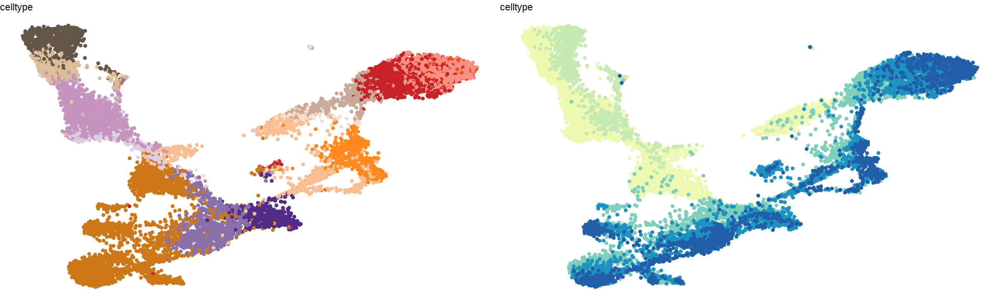

In [85]:
get_umap(PC1 = latent, PC2 = LSI, n_neighbors =  30, min_dist= 0.3, plot=TRUE)

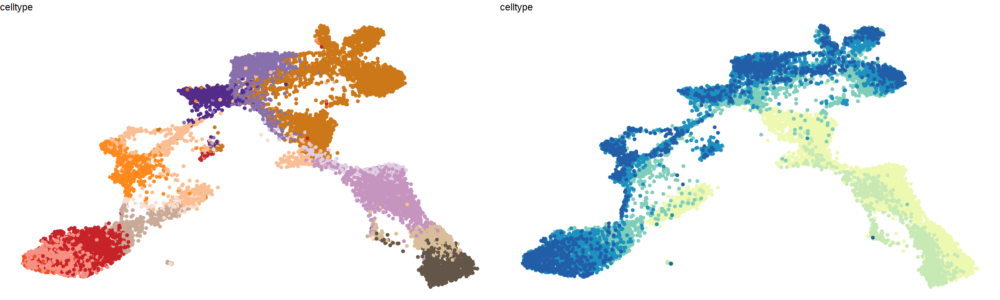

In [83]:
get_umap(PC1 = latent, PC2 = LSI, n_neighbors = 50, min_dist= 0.3, plot=TRUE)

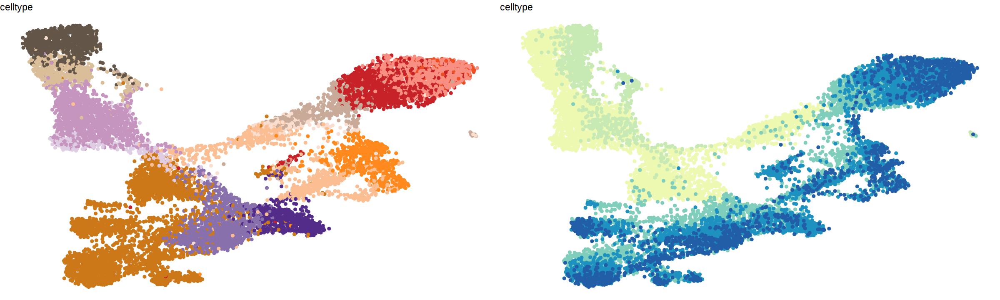

In [86]:
get_umap(PC1 = latent, PC2 = LSI, n_neighbors = 30, min_dist= 0.5, plot=TRUE)

In [92]:
umap.dt = get_umap(PC1 = latent, PC2 = LSI, n_neighbors = 30, min_dist= 0.5, plot=FALSE)

In [93]:
head(umap.dt)

cell,UMAP1,UMAP2,celltype,stage,sample
<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
E7.5_rep1#AAACAGCCATCCTGAA-1,-5.116272,0.2761522,Mixed_mesoderm,E7.5,E7.5_rep1
E7.5_rep1#AAACAGCCATGCTATG-1,-7.118282,5.5744099,Primitive_Streak,E7.5,E7.5_rep1
E7.5_rep1#AAACATGCAGGATAAC-1,2.344597,2.2574367,Blood_progenitors_1,E7.5,E7.5_rep1
E7.5_rep1#AAACCGGCAACCCTAA-1,-6.028426,4.0665468,Nascent_mesoderm,E7.5,E7.5_rep1
E7.5_rep1#AAACCGGCAACCTAAT-1,1.983194,1.3322712,Haematoendothelial_progenitors,E7.5,E7.5_rep1
E7.5_rep1#AAACGGATCACGCCAA-1,-6.897877,6.2332934,Primitive_Streak,E7.5,E7.5_rep1


[1] 9

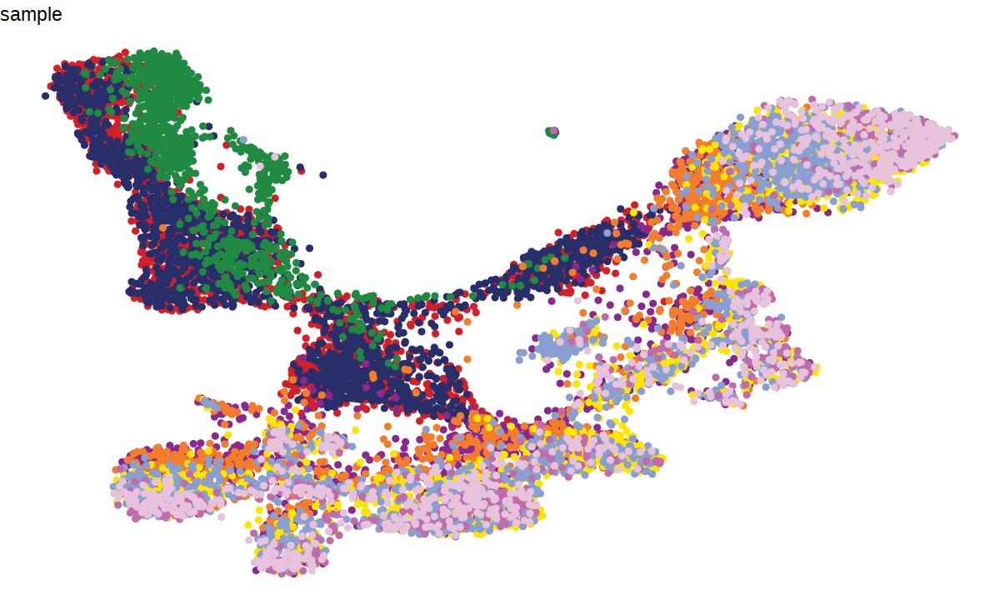

In [107]:
options(repr.plot.width=10, repr.plot.height=6)

palette = ArchRPalettes$stallion[1:length(unique(umap.dt$sample))]
names(palette) = unique(umap.dt$sample)

ggplot(umap.dt, aes(UMAP1, UMAP2, col=sample)) + 
        geom_point() + 
        scale_colour_manual(values=palette) + 
        ggtitle('sample') + 
        theme_void() + 
        theme(legend.position="none")

In [112]:
extended_sce = readRDS('/rds/project/rds-SDzz0CATGms/users/bt392/atlasses/extended/embryo_sce.rds')

In [120]:
extended_meta = colData(extended_sce) %>% 
    as.data.table(keep.rownames=F) %>% 
    .[,c('cell', 'celltype_extended_atlas')]

Warning message in .local(x, row.names, optional, ...):
“Arguments in '...' ignored”


In [122]:
sample_metadata = merge(sample_metadata, extended_meta, by.x='closest.cell', by.y='cell', all.x=T)

In [124]:
head(sample_metadata)

closest.cell,cell,barcode,sample,nFeature_RNA,nCount_RNA,mitochondrial_percent_RNA,ribosomal_percent_RNA,stage,genotype,pass_rnaQC,doublet_score,doublet_call,celltype,celltype.score,pass_atacQC,celltype_extended_atlas
<chr>,<chr>,<chr>,<chr>,<int>,<int>,<dbl>,<dbl>,<chr>,<lgl>,<lgl>,<dbl>,<lgl>,<chr>,<dbl>,<lgl>,<fct>
cell_10,E7.5_rep1#GCCAACATCAGGCTAT-1,GCCAACATCAGGCTAT-1,E7.5_rep1,2193,5479,32.43,9.36,E7.5,NA,TRUE,0.06,FALSE,Epiblast,1.00,TRUE,Epiblast
cell_1000,E7.5_rep1#CATAGGTTCCCTCACG-1,CATAGGTTCCCTCACG-1,E7.5_rep1,3488,7297,2.97,5.11,E7.5,NA,TRUE,0.52,FALSE,Primitive_Streak,0.52,TRUE,Caudal epiblast
cell_1000,E7.5_rep1#CTGCTACTCACGTTAA-1,CTGCTACTCACGTTAA-1,E7.5_rep1,2452,5418,23.31,5.83,E7.5,NA,TRUE,0.22,FALSE,Primitive_Streak,0.32,TRUE,Caudal epiblast
cell_1000,E7.5_rep1#GGTTTCTGTTAGAGGG-1,GGTTTCTGTTAGAGGG-1,E7.5_rep1,2565,5956,23.61,8.38,E7.5,NA,TRUE,0.07,FALSE,Primitive_Streak,0.56,TRUE,Caudal epiblast
cell_1000,E7.5_rep1#GTTGCGGGTAAGGTCC-1,GTTGCGGGTAAGGTCC-1,E7.5_rep1,3535,9440,24.79,7.33,E7.5,NA,TRUE,0.34,FALSE,Primitive_Streak,0.52,TRUE,Caudal epiblast
cell_1000,E7.5_rep2#ACGAGTAAGGAAGTAT-1,ACGAGTAAGGAAGTAT-1,E7.5_rep2,2654,5767,22.02,6.55,E7.5,NA,TRUE,0.20,FALSE,Primitive_Streak,0.52,TRUE,Caudal epiblast


In [125]:
umap.dt = merge(umap.dt, sample_metadata[, c('cell', 'celltype_extended_atlas')])

In [129]:
opts$extended.celltype.colors = c(
 "Epiblast" = "#635547",
"Primitive Streak" = "#DABE99",
"Caudal epiblast" = "#9e6762",

"PGC" = "#FACB12",

"Anterior Primitive Streak" = "#c19f70",
"Node"="#153b3d",
"Notochord" = "#0F4A9C",



"Gut tube" = "#EF5A9D",
"Hindgut" = "#F397C0",
"Midgut" = "#ff00b2",
"Foregut" = "#ffb7ff",
"Pharyngeal endoderm"="#95e1ff",
"Thyroid primordium"="#97bad3",

"Nascent mesoderm" = "#C594BF",
"Intermediate mesoderm" = "#139992",
"Caudal mesoderm" = "#3F84AA",
"Lateral plate mesoderm" = "#F9DFE6",
"Limb mesoderm" = "#e35f82",
"Forelimb" = "#d02d75",
"Kidney primordium" = "#e85639",
"Presomitic mesoderm"="#5581ca",#"#0000ff",#blue
"Somitic mesoderm" = "#005579",
"Posterior somitic tissues" = "#5adbe4",#"#40e0d0",#turquoise



"Paraxial mesoderm" = "#8DB5CE",
"Cranial mesoderm" = "#456722",#"#006400",#darkgreen
"Anterior somitic tissues"= "#d5e839",
"Sclerotome" = "#e3cb3a",#"#ffff00",#yellow
"Dermomyotome" = "#00BFC4",#"#a52a2a",#brown



"Pharyngeal mesoderm" = "#C9EBFB",
"Cardiopharyngeal progenitors" = "#556789",
"Anterior cardiopharyngeal progenitors"="#683ed8",



"Allantois" = "#532C8A",
"Mesenchyme" = "#cc7818",
"YS mesothelium" = "#ff7f9c",
"Epicardium"="#f79083",
"Embryo proper mesothelium" = "#ff487d",



"Cardiopharyngeal progenitors FHF"="#d780b0",
"Cardiomyocytes FHF 1"="#a64d7e",
"Cardiomyocytes FHF 2"="#B51D8D",



"Cardiopharyngeal progenitors SHF"="#4b7193",
"Cardiomyocytes SHF 1"="#5d70dc",
"Cardiomyocytes SHF 2"="#332c6c",



"Haematoendothelial progenitors" = "#FBBE92",
"Blood progenitors" = "#6c4b4c",
"Erythroid" = "#C72228",
"Chorioallantoic-derived erythroid progenitors"="#E50000",
"Megakaryocyte progenitors"="#e3cb3a",
"MEP"="#EF4E22",
"EMP"="#7c2a47",



"YS endothelium"="#ff891c",
"YS mesothelium-derived endothelial progenitors"="#AE3F3F",
"Allantois endothelium"="#2f4a60",
"Embryo proper endothelium"="#90e3bf",
"Venous endothelium"="#bd3400",
"Endocardium"="#9d0049",

"NMPs/Mesoderm-biased" = "#89c1f5",
"NMPs" = "#8EC792",

"Ectoderm" = "#ff675c",



"Optic vesicle" = "#bd7300",

"Ventral forebrain progenitors"="#a0b689",
"Early dorsal forebrain progenitors"="#0f8073",
"Late dorsal forebrain progenitors"="#7a9941",
"Midbrain/Hindbrain boundary"="#8ab3b5",
"Midbrain progenitors"="#9bf981",
"Dorsal midbrain neurons"="#12ed4c",
"Ventral hindbrain progenitors"="#7e907a",
"Dorsal hindbrain progenitors"="#2c6521",
"Hindbrain floor plate"="#bf9da8",
"Hindbrain neural progenitors"="#59b545",



"Neural tube"="#233629",



"Migratory neural crest"="#4a6798",
"Branchial arch neural crest"="#bd84b0",
"Frontonasal mesenchyme"="#d3b1b1",



"Spinal cord progenitors"="#6b2035",
"Dorsal spinal cord progenitors"="#e273d6",

"Non-neural ectoderm" = "#f7f79e",
"Surface ectoderm" = "#fcff00",
"Epidermis" = "#fff335",
"Limb ectoderm" = "#ffd731",
"Amniotic ectoderm" = "#dbb400",



"Placodal ectoderm" = "#ff5c00",



"Otic placode"="#f1a262",
"Otic neural progenitors"="#00b000",

"Visceral endoderm" = "#F6BFCB",
"ExE endoderm" = "#7F6874",
"ExE ectoderm" = "#989898",
"Parietal endoderm" = "#1A1A1A"
)


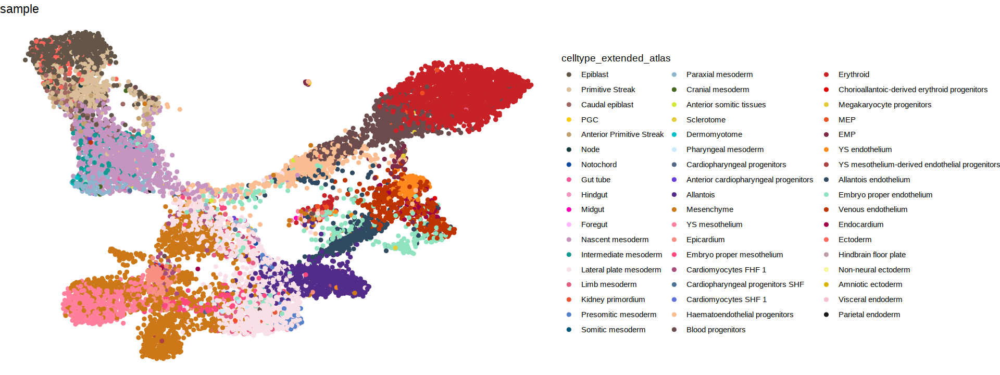

In [137]:
options(repr.plot.width=16, repr.plot.height=6)

ggplot(umap.dt, aes(UMAP1, UMAP2, col=celltype_extended_atlas)) + 
        geom_point() + 
        scale_colour_manual(values=opts$extended.celltype.colors[names(opts$extended.celltype.colors) %in% umap.dt$celltype_extended_atlas]) + 
        ggtitle('celltype extended') + 
        theme_void() + 
        theme(legend.position="right")

In [191]:
# Color by LSI/VI
umap.dt2 = merge(umap.dt, as.data.table(LSI, ,keep.rownames=T), by.x='cell', by.y='rn')
umap.dt2 = merge(umap.dt2, as.data.table(latent,keep.rownames=T), by.x='cell', by.y='rn')

In [213]:
PCs = colnames(umap.dt2[,8:length(umap.dt2)])
plots = mclapply(PCs, function(x){
    values = scale(umap.dt2[[x]])
    p = ggplot(umap.dt2, aes(UMAP1, UMAP2, col=values)) + 
        geom_point() + 
        scale_color_gradient2(low='blue', mid='white', high='red') + 
        ggtitle(x) + 
        theme_void() + 
        theme(legend.position="none",
              text=element_text(size=20))
    return(p)
}, mc.cores=16)

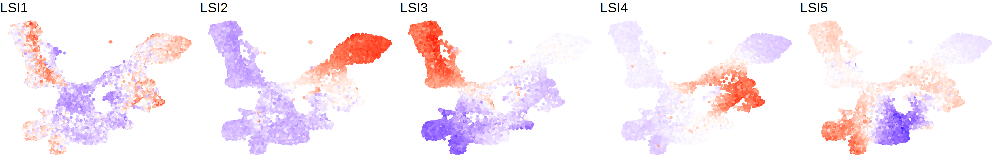

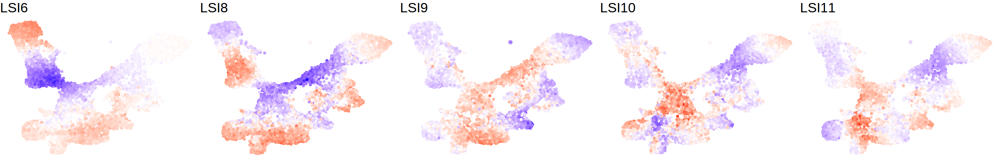

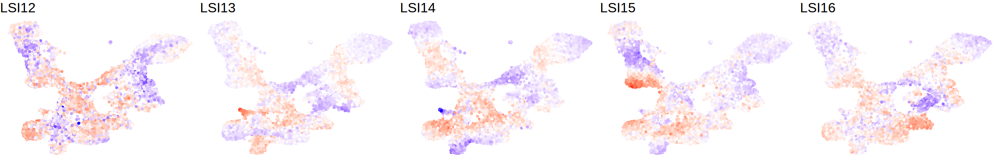

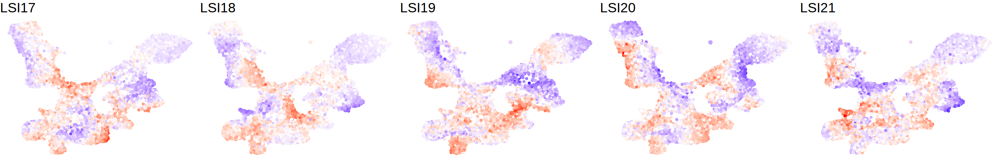

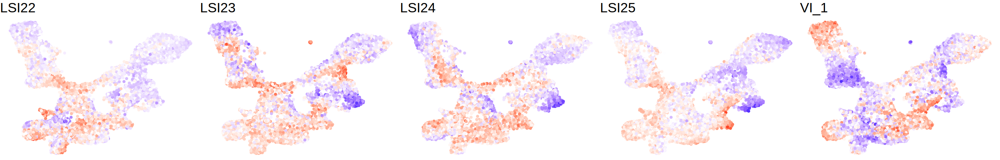

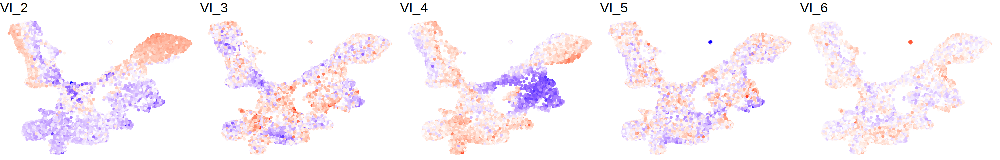

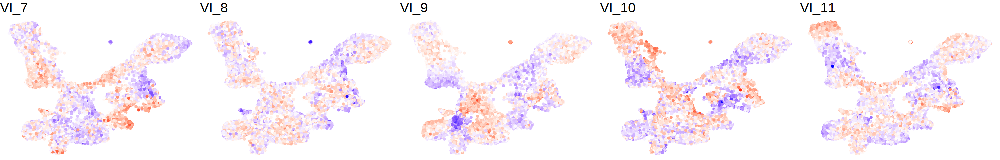

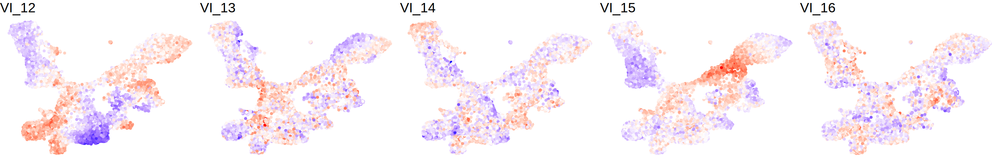

$`1`

$`2`

$`3`

$`4`

$`5`

$`6`

$`7`

$`8`

$`9`

$`10`

attr(,"class")
[1] "list"      "ggarrange"

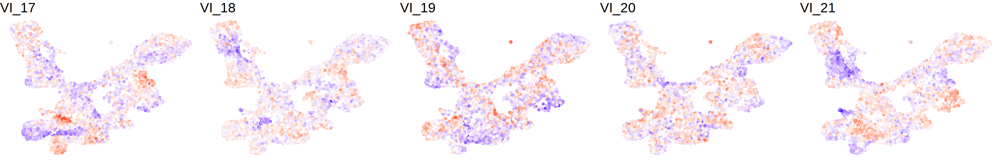

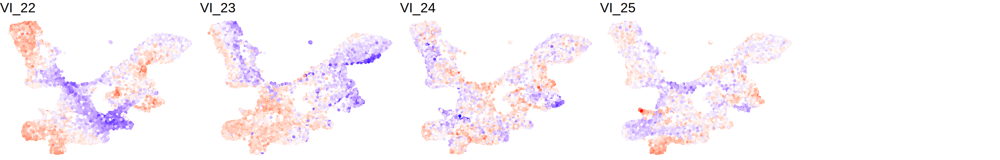

In [215]:
options(repr.plot.width=25, repr.plot.height=4)
ggarrange(plotlist = plots, ncol=5)

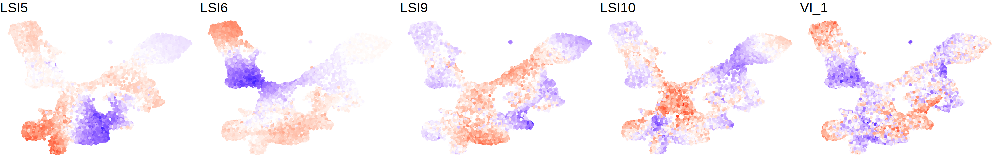

In [218]:
ggarrange(plotlist = plots[c(5,6,8,9,25)], ncol=5)